In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from chaosmagpy.model_utils import design_gauss
import cartopy.crs as ccrs
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
from alberte_klara_lib import do_design, plot_map_three
from alberte_klara_lib import n_int_max, n_ext_max, theta_grid, phi_grid
import os

from alberte_klara_lib import do_design, plot_map_three, plot_map_one

from scipy.stats import norm



import matplotlib.gridspec as gridspec


C:\Users\alber\AppData\Local\Temp\ipykernel_28236\2143577139.py:1: DeprecationWarning: 
Pyarrow will become a required dependency of pandas in the next major release of pandas (pandas 3.0),
(to allow more performant data types, such as the Arrow string type, and better interoperability with other libraries)
but was not found to be installed on your system.
If this would cause problems for you,
please provide us feedback at https://github.com/pandas-dev/pandas/issues/54466
        
  import pandas as pd


In [2]:
data_dst = "ready_oersted_data\oersted_dark_quiet_99.txt"
data = pd.read_table(data_dst, delimiter = ",")
data

<>:1: SyntaxWarning: invalid escape sequence '\o'
<>:1: SyntaxWarning: invalid escape sequence '\o'
C:\Users\alber\AppData\Local\Temp\ipykernel_28236\3766912567.py:1: SyntaxWarning: invalid escape sequence '\o'
  data_dst = "ready_oersted_data\oersted_dark_quiet_99.txt"


,time_stamp,radius,colat,lon,B_r,B_theta,B_phi,X,Y,Z,dDst,Hp30,F,B_radius
0,-180.592967,7062.271,59.2412,-135.7557,-24903.41,-18948.13,4911.32,18948.13,4911.32,24903.41,0.000000,0.667000,31675.424611,-24903.41
1,-179.402650,7029.945,111.6406,148.9944,28497.94,-23073.11,4179.94,23073.11,4179.94,-28497.94,1.672657,1.115078,36904.916850,28497.94
2,-179.399629,7037.983,127.6251,145.4625,40528.63,-16187.60,3668.19,16187.60,3668.19,-40528.63,1.817675,1.211668,43795.705969,40528.63
3,-179.398775,7041.610,132.1228,144.2809,42956.53,-13879.66,3319.22,13879.66,3319.22,-42956.53,1.858659,1.238966,45265.059955,42956.53
4,-179.397934,7045.737,136.5383,142.9883,44900.67,-11473.02,2885.29,11473.02,2885.29,-44900.67,1.899010,1.265842,46433.018992,44900.67
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
47725,3.956973,7239.201,84.4464,-18.7071,1934.03,-19067.21,-3888.41,19067.21,-3888.41,-1934.03,2.205868,2.732288,19555.528670,1934.03
47726,3.957709,7237.607,88.1296,-19.3923,4311.00,-18094.52,-4130.18,18094.52,-4130.18,-4311.00,2.364752,2.696978,19053.995955,4311.00
47727,3.958444,7235.544,91.8147,-20.0760,6381.86,-17009.89,-4329.24,17009.89,-4329.24,-6381.86,2.523631,2.665219,18676.370468,6381.86
47728,3.959298,7232.573,96.0949,-20.8723,8401.44,-15689.38,-4499.83,15689.38,-4499.83,-8401.44,2.708048,2.651530,18357.268557,8401.44


In [3]:
nm_static = (n_int_max + 1)**2 - 1 + (n_ext_max + 1)**2 - 1
n_obs = len(data)

# lhs and rhs of lst sq prb will have to be constructed bit by bit
# allocating these in memory
lhs = np.zeros((nm_static, nm_static)) # G.T@G
rhs = np.zeros((nm_static,)) # G.T@d

# taking 10k data point at a time (sub matrix, chunk of data, G_sub) - but still all model parameters
i = 0
while (i <= n_obs - 10*10**3):
    i10k = i + 10*10**3

    G_int = np.vstack((design_gauss(data['radius'].iloc[i:i10k], data['colat'].iloc[i:i10k], data['lon'].iloc[i:i10k], nmax=n_int_max)))
    print(G_int.shape)
    G_ext = np.vstack((design_gauss(data['radius'].iloc[i:i10k], data['colat'].iloc[i:i10k], data['lon'].iloc[i:i10k], nmax=n_ext_max, source = 'external')))
    G = np.hstack((G_int, G_ext))
    lhs += G.T@G

    d = np.hstack((data['B_radius'].iloc[i:i10k], data['B_theta'].iloc[i:i10k], data['B_phi'].iloc[i:i10k]))
    rhs += G.T@d
    i += 10*10**3

G_int = np.vstack((design_gauss(data['radius'].iloc[i:], data['colat'].iloc[i:], data['lon'].iloc[i:], nmax=n_int_max)))
G_ext = np.vstack((design_gauss(data['radius'].iloc[i:], data['colat'].iloc[i:], data['lon'].iloc[i:], nmax=n_ext_max, source = 'external')))
G = np.hstack((G_int, G_ext))
lhs += G.T@G

d = np.hstack((data['B_radius'].iloc[i:], data['B_theta'].iloc[i:], data['B_phi'].iloc[i:]))
rhs += G.T@d


m = np.linalg.solve(lhs, rhs)

m_int_static = m[:-((n_ext_max + 1)**2 - 1)]
m_ext_static = m[-((n_ext_max + 1)**2 - 1):]

np.savetxt(os.path.join('ready_oersted_data', 'int_model_static_parameters'), m_int_static)
np.savetxt(os.path.join('ready_oersted_data', 'ext_model_static_parameters'), m_ext_static)

(30000, 195)
(30000, 195)
(30000, 195)
(30000, 195)


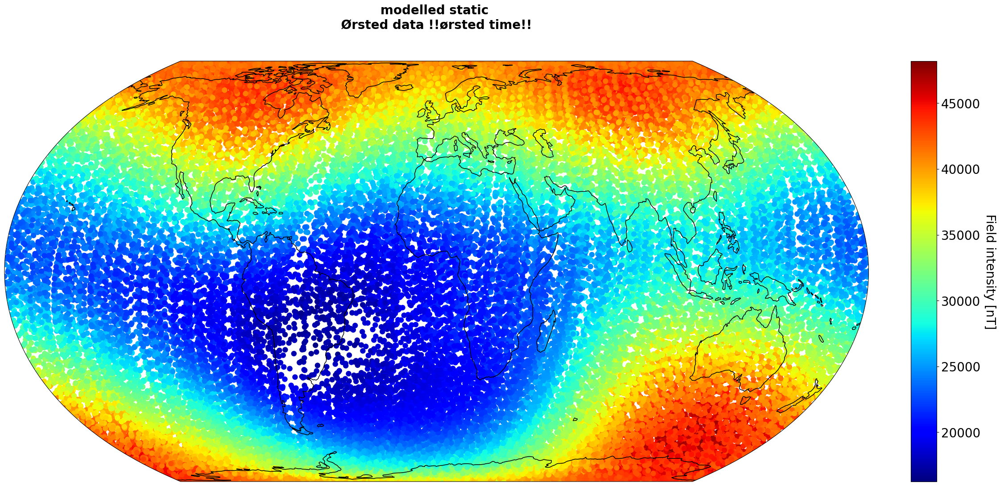

In [4]:
# Predicted field at Swarm altitude
G_pred_static_radius, G_pred_static_theta, G_pred_static_phi = do_design(data['radius'], data['colat'], data['lon'], n_int_max, n_ext_max)

b_pred_static_radius = G_pred_static_radius @ m
b_pred_static_theta = G_pred_static_theta @ m
b_pred_static_phi = G_pred_static_phi @ m

# field intensity
F_pred_static = np.sqrt(b_pred_static_radius**2 + b_pred_static_theta**2 + b_pred_static_phi**2)

# plot?


plot_map_one(F_pred_static, data['lon'], data['colat'], sat='Ørsted', title='modelled static', label='Field intensity [nT]', scatter_size=80)

# Residuals between model-predicted field and measured field

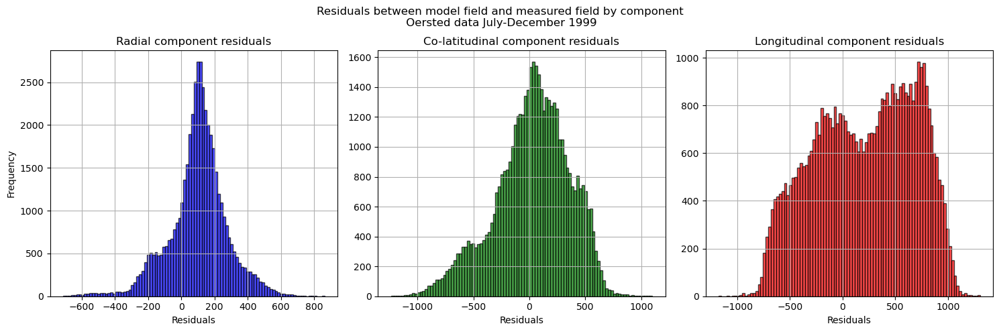

In [5]:
# Residuals
residuals_r_static = data['B_radius'] - b_pred_static_radius
residuals_t_static = data['B_theta'] - b_pred_static_theta
residuals_p_static = data['B_phi'] - b_pred_static_phi


# Plot histogram of residuals
fig, axs = plt.subplots(1, 3, figsize=(15, 5))

# Plot histogram of residuals_r
axs[0].hist(residuals_r_static, bins=100, color='blue', edgecolor='black', alpha=0.7)
axs[0].set_xlabel('Residuals')
axs[0].set_ylabel('Frequency')
axs[0].set_title('Radial component residuals')
axs[0].grid(True)

# Plot histogram of residuals_t
axs[1].hist(residuals_t_static, bins=100, color='green', edgecolor='black', alpha=0.7)
axs[1].set_xlabel('Residuals')
# axs[1].set_ylabel('Frequency')
axs[1].set_title('Co-latitudinal component residuals')
axs[1].grid(True)

# Plot histogram of residuals_p
axs[2].hist(residuals_p_static, bins=100, color='red', edgecolor='black', alpha=0.7)
axs[2].set_xlabel('Residuals')
# axs[2].set_ylabel('Frequency')
axs[2].set_title('Longitudinal component residuals')
axs[2].grid(True)

# Adjust layout
plt.tight_layout()
plt.subplots_adjust(top=0.85)

fig.suptitle('Residuals between model field and measured field by component\n Oersted data July-December 1999')
plt.savefig('oersted_figures/oersted_differet_times/oersted_residuals_jun_dec99.png')

plt.show()



 A symmetric bell-shaped histogram which is evenly distributed around zero indicates that the normality assumption is likely to be true. If the histogram indicates that random error is not normally distributed, it suggests that the model's underlying assumptions may have been violated.

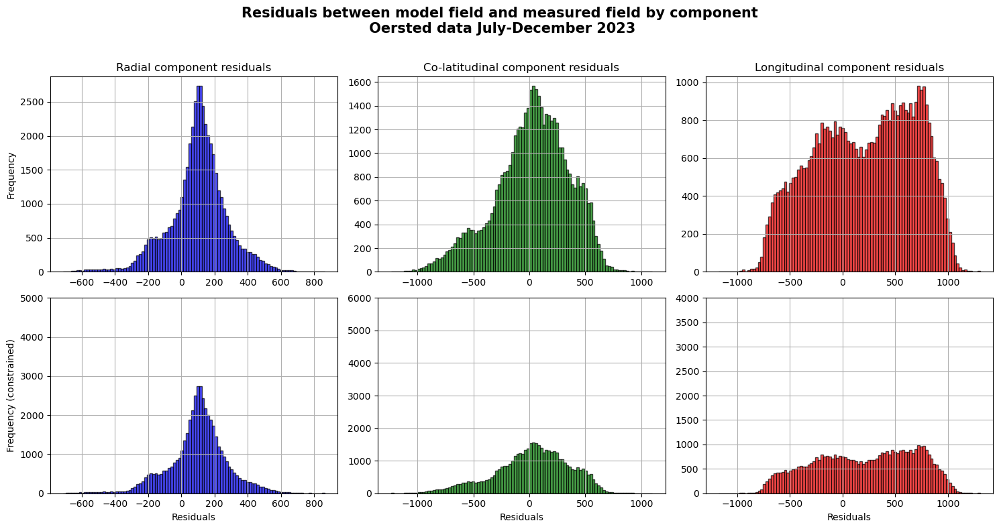

In [6]:
# Plot histogram of residuals
fig, axs = plt.subplots(2, 3, figsize=(15, 8))

# Plot histogram of residuals_r
axs[0, 0].hist(residuals_r_static, bins=100, color='blue', edgecolor='black', alpha=0.7)
axs[0, 0].set_ylabel('Frequency')
axs[0, 0].set_title('Radial component residuals')
axs[0, 0].grid(True)

# Plot histogram of residuals_t
axs[0, 1].hist(residuals_t_static, bins=100, color='green', edgecolor='black', alpha=0.7)
axs[0, 1].set_title('Co-latitudinal component residuals')
axs[0, 1].grid(True)

# Plot histogram of residuals_p
axs[0, 2].hist(residuals_p_static, bins=100, color='red', edgecolor='black', alpha=0.7)
axs[0, 2].set_title('Longitudinal component residuals')
axs[0, 2].grid(True)

# Plot histogram of residuals_r (constrained)
axs[1, 0].hist(residuals_r_static, bins=100, color='blue', edgecolor='black', alpha=0.7)
axs[1, 0].set_xlabel('Residuals')
axs[1, 0].set_ylabel('Frequency (constrained)')
axs[1, 0].set_ylim(0, 5000)
axs[1, 0].grid(True)

# Plot histogram of residuals_t (constrained)
axs[1, 1].hist(residuals_t_static, bins=100, color='green', edgecolor='black', alpha=0.7)
axs[1, 1].set_xlabel('Residuals')
axs[1, 1].set_ylim(0, 6000)
axs[1, 1].grid(True)

# Plot histogram of residuals_p (constrained)
axs[1, 2].hist(residuals_p_static, bins=100, color='red', edgecolor='black', alpha=0.7)
axs[1, 2].set_xlabel('Residuals')
axs[1, 2].set_ylim(0, 4000)
axs[1, 2].grid(True)

# Adjust layout
plt.tight_layout()
plt.subplots_adjust(top=0.85)

fig.suptitle('Residuals between model field and measured field by component\n Oersted data July-December 2023', weight = 'bold', fontsize = 15)

plt.show()

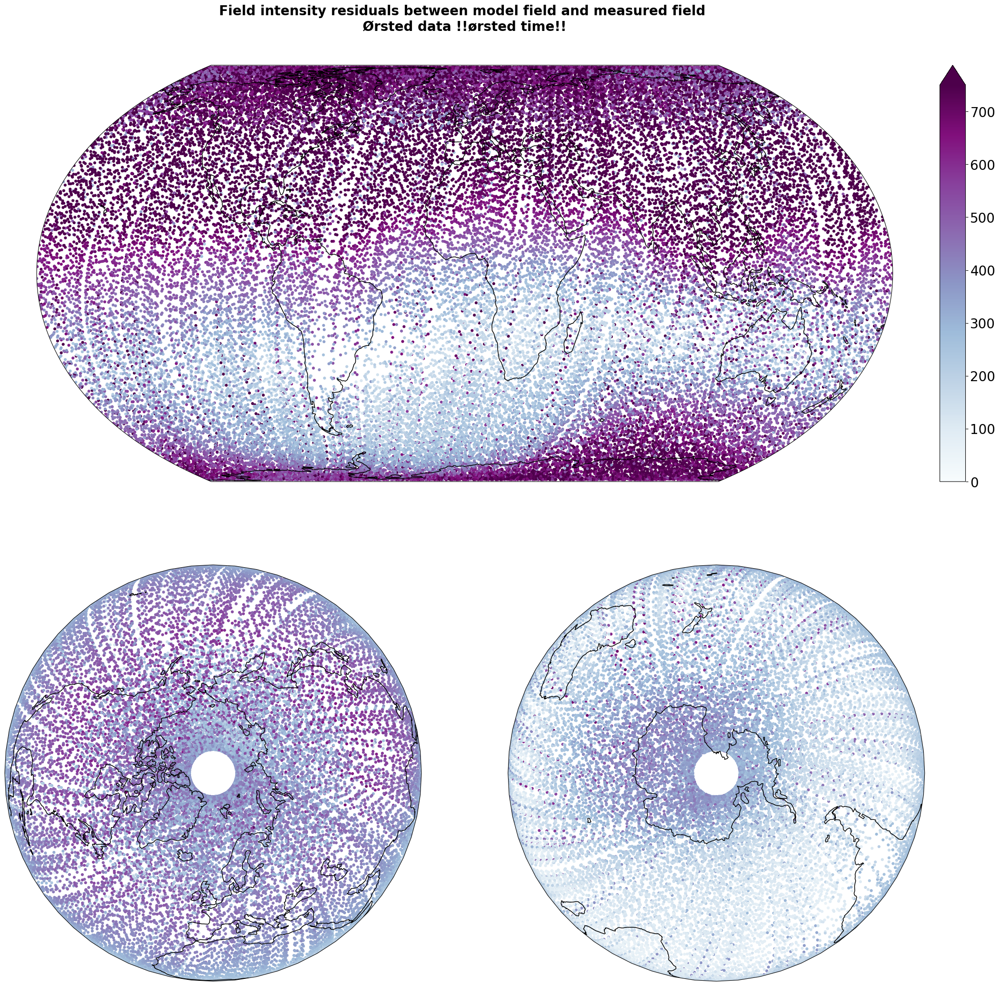

In [7]:
# Intensity of residuals on map
F_residuals = np.sqrt(residuals_r_static**2 + residuals_t_static**2 + residuals_p_static**2)

plot_map_three(F_residuals, data['lon'], data['colat'], 'Oersted', 'Field intensity residuals between model field and measured field', 'Residuals [nT]', scatter_size = 20, clim=[0, 750], colors='BuPu')

# Examine why residuals are like they are???

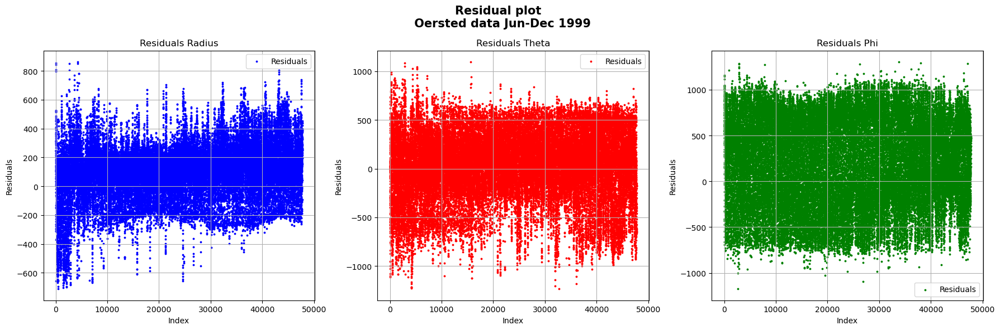

In [8]:
# Create a figure and subplots
fig, axs = plt.subplots(1, 3, figsize=(18, 6))

# Plot residuals radius
axs[0].scatter(range(len(residuals_r_static)), residuals_r_static, color='blue', label='Residuals', s=3)
axs[0].set_xlabel('Index')
axs[0].set_ylabel('Residuals')
axs[0].set_title('Residuals Radius')
axs[0].grid(True)
axs[0].legend()

# Plot residuals theta
axs[1].scatter(range(len(residuals_t_static)), residuals_t_static, color='red', label='Residuals', s=3)
axs[1].set_xlabel('Index')
axs[1].set_ylabel('Residuals')
axs[1].set_title('Residuals Theta')
axs[1].grid(True)
axs[1].legend()

# Plot residuals phi
axs[2].scatter(range(len(residuals_p_static)), residuals_p_static, color='green', label='Residuals', s=3)
axs[2].set_xlabel('Index')
axs[2].set_ylabel('Residuals')
axs[2].set_title('Residuals Phi')
axs[2].grid(True)
axs[2].legend()

fig.suptitle('Residual plot \n Oersted data Jun-Dec 1999', weight = 'bold', fontsize = 15)

plt.tight_layout()
plt.show()

a horizontal-band pattern suggests that the variance of the residuals is constant.

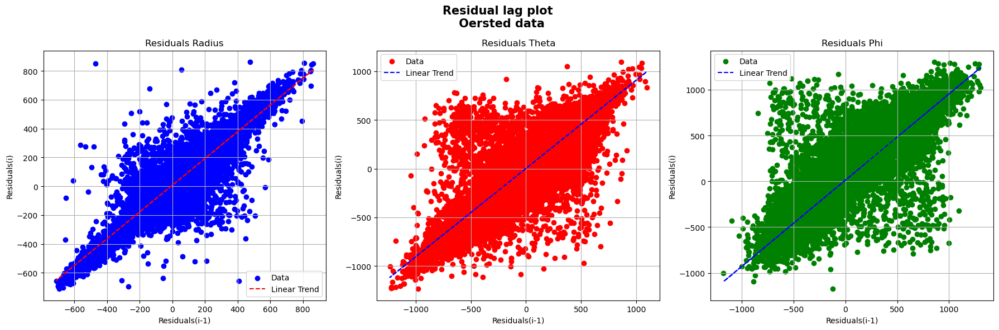

In [9]:
# Initialize lists to store residuals(i-1) and residuals(i)
residuals_r_i_minus_1 = []
residuals_r_i = []

# Iterate over the residuals data to populate the lists
for i in range(1, len(residuals_r_static)):
    residuals_r_i_minus_1.append(residuals_r_static[i - 1])
    residuals_r_i.append(residuals_r_static[i])


# Initialize lists to store residuals(i-1) and residuals(i)
residuals_t_i_minus_1 = []
residuals_t_i = []

# Iterate over the residuals data to populate the lists
for i in range(1, len(residuals_t_static)):
    residuals_t_i_minus_1.append(residuals_t_static[i - 1])
    residuals_t_i.append(residuals_t_static[i])


# Initialize lists to store residuals(i-1) and residuals(i)
residuals_p_i_minus_1 = []
residuals_p_i = []

# Iterate over the residuals data to populate the lists
for i in range(1, len(residuals_p_static)):
    residuals_p_i_minus_1.append(residuals_p_static[i - 1])
    residuals_p_i.append(residuals_p_static[i])



# Create a figure and subplots
fig, axs = plt.subplots(1, 3, figsize=(18, 6))

# Plot residuals radius
axs[0].scatter(residuals_r_i_minus_1, residuals_r_i, color='blue', label='Data')
trend_line_r = np.poly1d(np.polyfit(residuals_r_i_minus_1, residuals_r_i, 1))
axs[0].plot(residuals_r_i_minus_1, trend_line_r(residuals_r_i_minus_1), color='red', linestyle='--', label='Linear Trend')
axs[0].set_xlabel('Residuals(i-1)')
axs[0].set_ylabel('Residuals(i)')
axs[0].set_title('Residuals Radius')
axs[0].grid(True)
axs[0].legend()

# Plot residuals theta
axs[1].scatter(residuals_t_i_minus_1, residuals_t_i, color='red', label='Data')
trend_line_t = np.poly1d(np.polyfit(residuals_t_i_minus_1, residuals_t_i, 1))
axs[1].plot(residuals_t_i_minus_1, trend_line_t(residuals_t_i_minus_1), color='blue', linestyle='--', label='Linear Trend')
axs[1].set_xlabel('Residuals(i-1)')
axs[1].set_ylabel('Residuals(i)')
axs[1].set_title('Residuals Theta')
axs[1].grid(True)
axs[1].legend()

# Plot residuals phi
axs[2].scatter(residuals_p_i_minus_1, residuals_p_i, color='green', label='Data')
trend_line_p = np.poly1d(np.polyfit(residuals_p_i_minus_1, residuals_p_i, 1))
axs[2].plot(residuals_p_i_minus_1, trend_line_p(residuals_p_i_minus_1), color='blue', linestyle='--', label='Linear Trend')
axs[2].set_xlabel('Residuals(i-1)')
axs[2].set_ylabel('Residuals(i)')
axs[2].set_title('Residuals Phi')
axs[2].grid(True)
axs[2].legend()


fig.suptitle('Residual lag plot \n Oersted data', weight = 'bold', fontsize = 15)
plt.tight_layout()
plt.show()


Any non-random pattern in a lag plot suggests that the variance is not random.

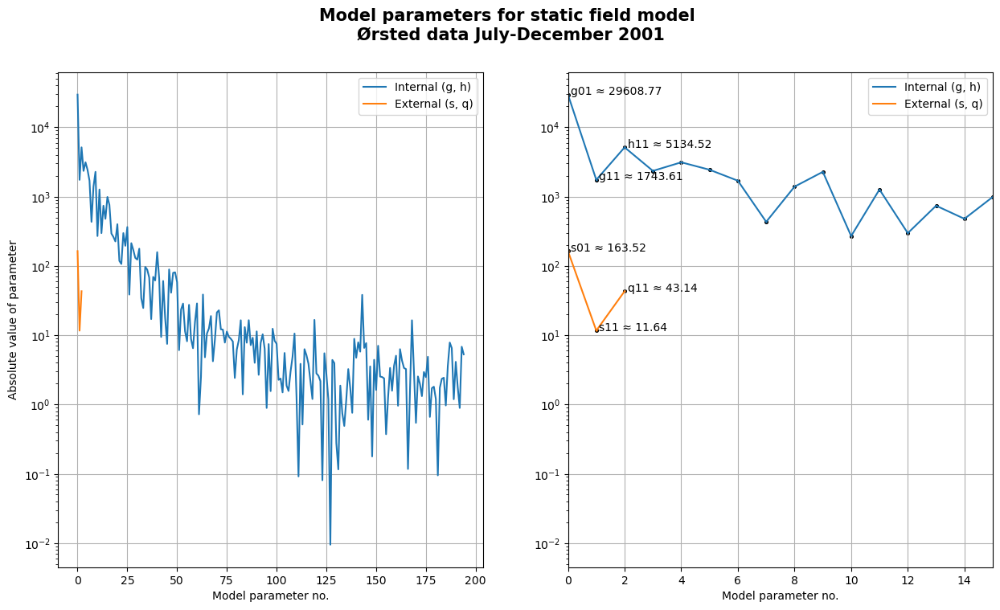

In [10]:
# Plot coefficients for static model
first_three_int = np.round(abs(m_int_static[:3]), 2)
first_three_ext = np.round(abs(m_ext_static[:3]), 2)
first_three_int_str = ['g01 \u2248 ' + str(first_three_int[0]), 'g11 \u2248 ' + str(first_three_int[1]), 'h11 \u2248 ' + str(first_three_int[2])]
first_three_ext_str = ['s01 \u2248 ' + str(first_three_ext[0]), 's11 \u2248 ' + str(first_three_ext[1]), 'q11 \u2248 ' + str(first_three_ext[2])]

plt.figure(figsize=(15, 8))

plt.subplot(1, 2, 1)
plt.semilogy(range((n_int_max + 1)**2 - 1), abs(m_int_static), label='Internal (g, h)')
plt.semilogy(range((n_ext_max + 1)**2 - 1), abs(m_ext_static), label='External (s, q)')
plt.legend()
plt.grid()
plt.ylabel('Absolute value of parameter')
plt.xlabel('Model parameter no.')

plt.subplot(1, 2, 2)
plt.semilogy(range((n_int_max + 1)**2 - 1), abs(m_int_static), label='Internal (g, h)')
plt.semilogy(range((n_ext_max + 1)**2 - 1), abs(m_ext_static), label='External (s, q)')
plt.scatter(range((n_int_max + 1)**2 - 1), abs(m_int_static), s=7, edgecolor='black')
plt.scatter(range((n_ext_max + 1)**2 - 1), abs(m_ext_static), s=7, edgecolor='black')

for i, value in enumerate(first_three_int_str):
    plt.annotate(value, xy=(i, first_three_int[i]), xytext=(i + 0.1, first_three_int[i]))
for i, value in enumerate(first_three_ext_str):
    plt.annotate(value, xy=(i, first_three_ext[i]), xytext=(i + 0.1, first_three_ext[i]))

plt.xlim(0, 15)
plt.legend()
plt.grid()
plt.xlabel('Model parameter no.')
plt.suptitle('Model parameters for static field model \nØrsted data July-December 2001', weight = 'bold', fontsize = 15)

plt.show()

# Examination of why data is wierd


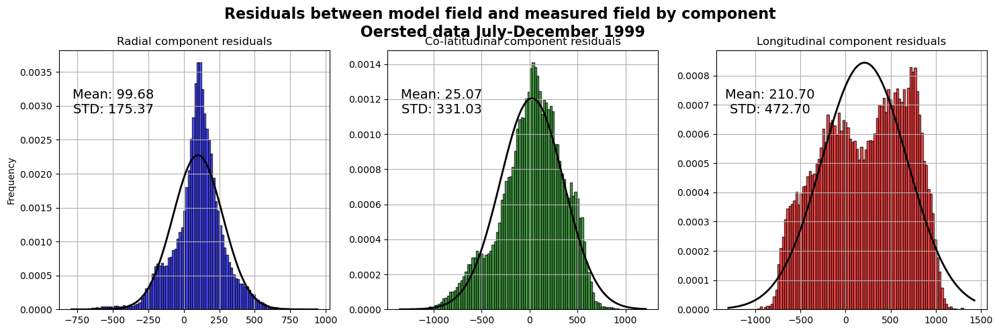

In [11]:
# Calculate mean values
mean_r = np.mean(residuals_r_static)
mean_t = np.mean(residuals_t_static)
mean_p = np.mean(residuals_p_static)

# Calculate standard deviation values
std_r = np.std(residuals_r_static)
std_t = np.std(residuals_t_static)
std_p = np.std(residuals_p_static)

# Plot histogram of residuals
fig, axs = plt.subplots(1, 3, figsize=(15, 5))  # Change to 1 row and 3 columns

# Plot histogram of residuals_r
axs[0].hist(residuals_r_static, bins=100, color='blue', edgecolor='black', alpha=0.7, density=True)
axs[0].set_ylabel('Frequency')
axs[0].set_title('Radial component residuals')
axs[0].grid(True)

# Overlay Gaussian distribution curve
xmin, xmax = axs[0].get_xlim()
x = np.linspace(xmin, xmax, 100)
p = norm.pdf(x, mean_r, std_r)
axs[0].plot(x, p, 'k', linewidth=2)

# Plot histogram of residuals_t
axs[1].hist(residuals_t_static, bins=100, color='green', edgecolor='black', alpha=0.7, density=True)
axs[1].set_title('Co-latitudinal component residuals')
axs[1].grid(True)

# Overlay Gaussian distribution curve
xmin, xmax = axs[1].get_xlim()
x = np.linspace(xmin, xmax, 100)
p = norm.pdf(x, mean_t, std_t)
axs[1].plot(x, p, 'k', linewidth=2)

# Plot histogram of residuals_p
axs[2].hist(residuals_p_static, bins=100, color='red', edgecolor='black', alpha=0.7, density=True)
axs[2].set_title('Longitudinal component residuals')
axs[2].grid(True)

# Overlay Gaussian distribution curve
xmin, xmax = axs[2].get_xlim()
x = np.linspace(xmin, xmax, 100)
p = norm.pdf(x, mean_p, std_p)
axs[2].plot(x, p, 'k', linewidth=2)

# Add mean and std values
for ax, m, std in zip(axs, [mean_r, mean_t, mean_p], [std_r, std_t, std_p]):
    ax.text(0.2, 0.8, f'Mean: {m:.2f}\nSTD: {std:.2f}', transform=ax.transAxes, ha='center', va='center', color='black', fontsize=14)

# Adjust layout
plt.tight_layout()
plt.subplots_adjust(top=0.85)

fig.suptitle('Residuals between model field and measured field by component\n Oersted data July-December 1999', weight='bold', fontsize=16)

plt.show()

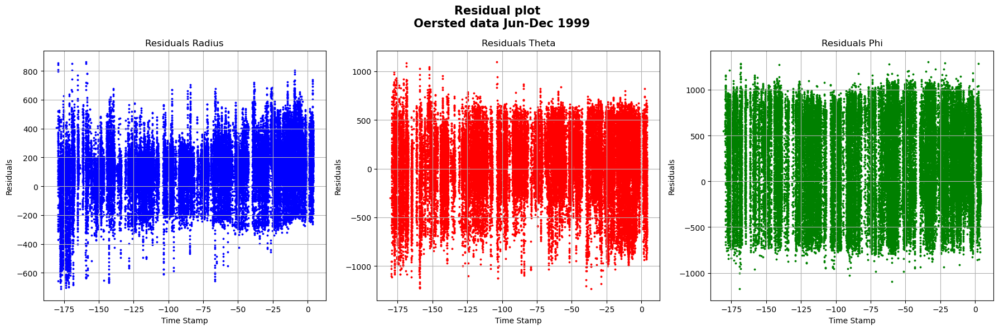

In [12]:
# Create a figure and subplots
fig, axs = plt.subplots(1, 3, figsize=(18, 6))

# Plot residuals radius
axs[0].scatter(data['time_stamp'], residuals_r_static, color='blue', label='Residuals', s=3)
axs[0].set_xlabel('Time Stamp')
axs[0].set_ylabel('Residuals')
axs[0].set_title('Residuals Radius')
axs[0].grid(True)
#axs[0].legend()

# Plot residuals theta
axs[1].scatter(data['time_stamp'], residuals_t_static, color='red', label='Residuals', s=3)
axs[1].set_xlabel('Time Stamp')
axs[1].set_ylabel('Residuals')
axs[1].set_title('Residuals Theta')
axs[1].grid(True)
#axs[1].legend()

# Plot residuals phi
axs[2].scatter(data['time_stamp'], residuals_p_static, color='green', label='Residuals', s=3)
axs[2].set_xlabel('Time Stamp')
axs[2].set_ylabel('Residuals')
axs[2].set_title('Residuals Phi')
axs[2].grid(True)
#axs[2].legend()

fig.suptitle('Residual plot \n Oersted data Jun-Dec 1999', weight='bold', fontsize=15)

plt.tight_layout()
plt.show()

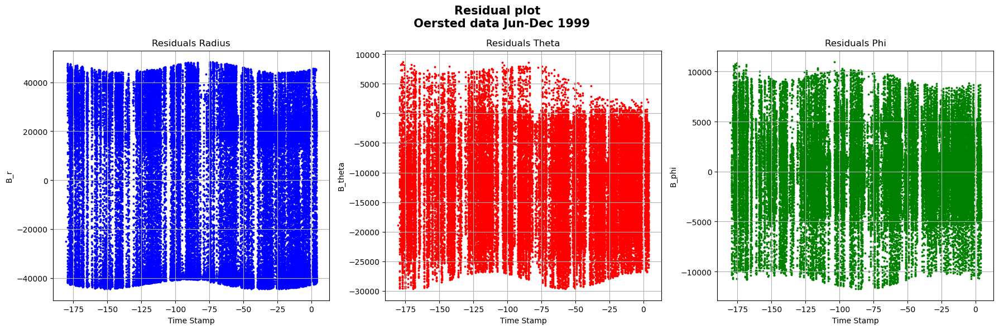

In [13]:
## Create a figure and subplots
fig, axs = plt.subplots(1, 3, figsize=(18, 6))

# Plot residuals radius
axs[0].scatter(data['time_stamp'], data['B_r'], color='blue', label='Residuals', s=3)
axs[0].set_xlabel('Time Stamp')
axs[0].set_ylabel('B_r')
axs[0].set_title('Residuals Radius')
axs[0].grid(True)

# Plot residuals theta
axs[1].scatter(data['time_stamp'], data['B_theta'], color='red', label='Residuals', s=3)
axs[1].set_xlabel('Time Stamp')
axs[1].set_ylabel('B_theta')
axs[1].set_title('Residuals Theta')
axs[1].grid(True)

# Plot residuals phi
axs[2].scatter(data['time_stamp'], data['B_phi'], color='green', label='Residuals', s=3)
axs[2].set_xlabel('Time Stamp')
axs[2].set_ylabel('B_phi')
axs[2].set_title('Residuals Phi')
axs[2].grid(True)

fig.suptitle('Residual plot \n Oersted data Jun-Dec 1999', weight='bold', fontsize=15)

plt.tight_layout()
plt.show()

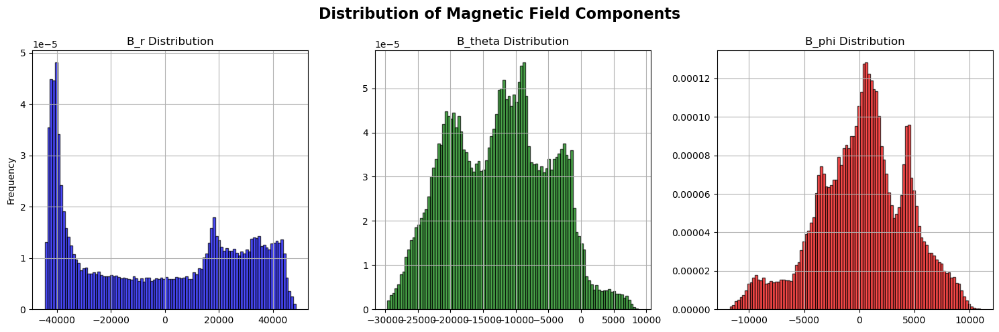

In [14]:

# Plot histogram of B_r
fig, axs = plt.subplots(1, 3, figsize=(15, 5))

axs[0].hist(data['B_r'], bins=100, color='blue', edgecolor='black', alpha=0.7, density=True)
axs[0].set_ylabel('Frequency')
axs[0].set_title('B_r Distribution')
axs[0].grid(True)



# Plot histogram of B_theta
axs[1].hist(data['B_theta'], bins=100, color='green', edgecolor='black', alpha=0.7, density=True)
axs[1].set_title('B_theta Distribution')
axs[1].grid(True)



# Plot histogram of B_phi
axs[2].hist(data['B_phi'], bins=100, color='red', edgecolor='black', alpha=0.7, density=True)
axs[2].set_title('B_phi Distribution')
axs[2].grid(True)

# Adjust layout
plt.tight_layout()
plt.subplots_adjust(top=0.85)

fig.suptitle('Distribution of Magnetic Field Components', weight='bold', fontsize=16)

plt.show()

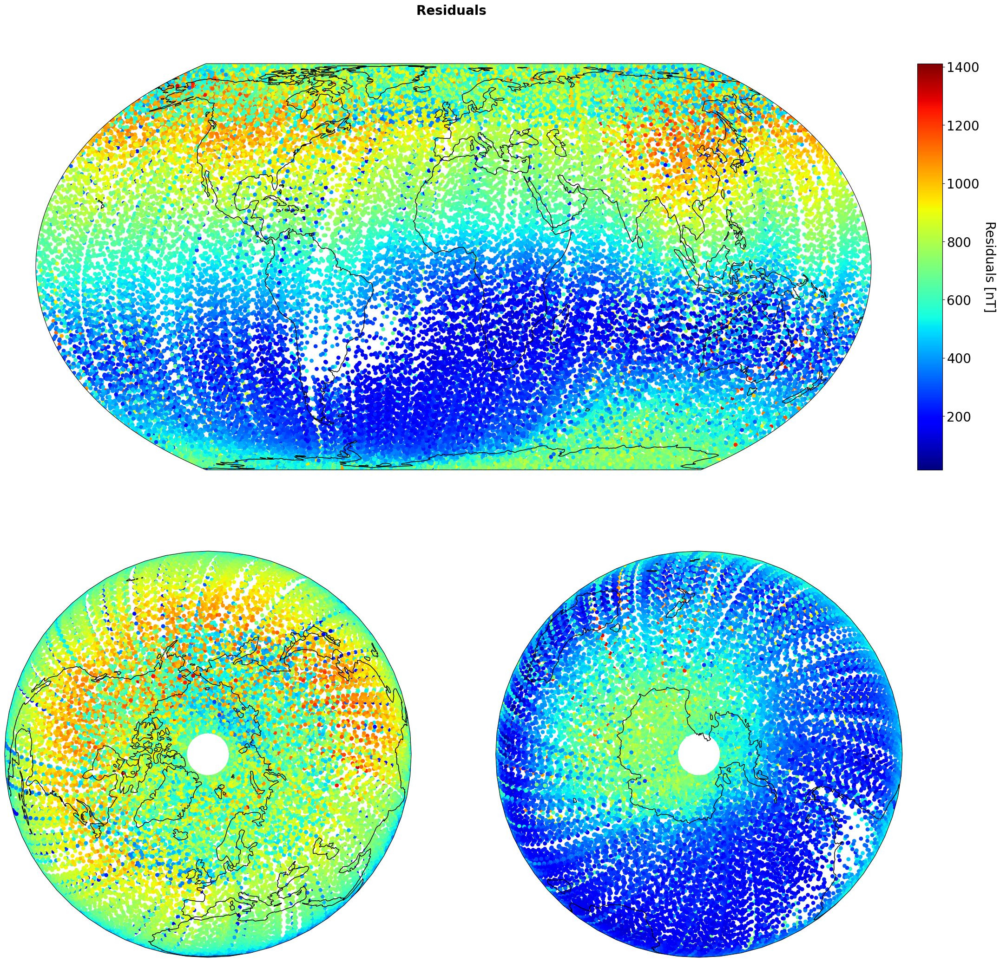

In [15]:
fig = plt.figure(figsize=(25, 25))
gs = fig.add_gridspec(2, 2)

axes = []
axes.append(plt.subplot(gs[1, 0], projection=ccrs.Orthographic(0, 90)))
axes.append(plt.subplot(gs[1, 1], projection=ccrs.Orthographic(180, -90)))
axes.append(plt.subplot(gs[0, :], projection=ccrs.EqualEarth()))

for ax in axes:
    pc = ax.scatter(data['lon'], y=90 - data['colat'], s=40, c=F_residuals, edgecolors='none', cmap='jet',
                    transform=ccrs.PlateCarree())
    ax.coastlines(linewidth=1.1)

# Add colorbar
plt.title('Residuals \n \n \n', weight='bold', fontsize=20)

# inset axes into global map and move upwards
cax = inset_axes(axes[-1], width="3%", height="100%", loc='right', borderpad=-11)

# use last artist for the colorbar
clb = plt.colorbar(pc, cax=cax)
clb.ax.tick_params(labelsize=20)
clb.set_label('Residuals [nT]', rotation=270, labelpad=25, fontsize=20)

# Setting minimum and maximum values for colorbar
# pc.set_clim(vmin=-200, vmax=200)  # Example values, you can set your own range